# FastAI Cassava Root Disease Classification

<br>

**This notebook contains implementations of ideas from the following papers:**
1. NFNet Architecture --> High-Performance Large-Scale Image Recognition Without Normalization 2021 (https://arxiv.org/abs/2102.06171v1)
2. Gradient Checkpointing --> Low-Memory Neural Network Training: A Technical Report 2019 (https://arxiv.org/abs/1904.10631)
3. MaxBlurPool Layer --> Making Convolutional Networks Shift-Invariant Again 2019 (https://arxiv.org/abs/1904.11486)
4. Mish Activation Function --> Mish: A Self Regularized Non-Monotonic Activation Function 2019 (https://arxiv.org/abs/1908.08681)
5. Swish Activation Function --> Searching for Activation Functions 2017 (https://arxiv.org/abs/1710.05941v2)
6. Rectified Adam Optimizer --> On the Variance of Adaptive Learning Rate and Beyond 2019 (https://arxiv.org/abs/1908.03265)
7. Look Ahead Optimizer --> Lookahead Optimizer: k steps forward, 1 step back 2019 (https://arxiv.org/abs/1907.08610)

<br>

**Major Frameworks used:**
1. FastAI (https://fast.ai)
2. PyTorch (https://pytorch.org)
3. Albumentations (https://albumentations.ai)
4. Timm - PyTorch Image Models (https://github.com/rwightman/pytorch-image-models)

<br>

**With Code Adapted from:**
1. Ross Wightman (https://github.com/rwightman)
2. Zach Mueller (https://github.com/muellerzr)



## Notes

1. We use a large amount of regularization on the test set and a moderate amount on the validation data.  Because we augment the validation data, we expect the straight accuracy to be poor ... in anticipation of performing Test Time Augmentation ensembling.
2. Because we use RAdam, we expect the straight accuracy to be possibly poorer than using Adam but with the hopes of creating a more generalizable model.

In [1]:

## PREVIOUS BEST WITH ACC = 0.87
# RUN_NAME_OF_MODEL_TO_LOAD = '20210210-1221 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=40 bs=8 res=480'
# EPOCH_TO_LOAD = 1


In [2]:
# RUN_NAME_OF_MODEL_TO_LOAD = '20210217-1008 - arch=densenetblur121d - samples=650 frozen=1 epochs=60 bs=32 res=300'
# EPOCH_TO_LOAD = 9

<br>
<br>

In [3]:

from datetime import datetime
import fastai
TEST = False
# ARCH = 'tf_efficientnet_b4_ns'  # resnet101
ARCH = 'tf_efficientnet_b4_ns'
CHOSEN_SAMPLE_SIZE = -1  # 10000 #-1 # 650 #1000  #1800  # use this to control per-category sample sizes # 1000  # deprecated but not removed
TEST_SET_SIZE = round(CHOSEN_SAMPLE_SIZE * 0.2)  # number of images per category to put in the test set
FROZEN_EPOCHS = 1  # 1
EPOCHS = 50  # 4
BATCH_SIZE = 48  # 16
RESOLUTION= 380
PRETRAINED_FLAG = True  # actually False - just to make sure we train a few times before attempting to find LR
GRAD_ACC = 128 # set this to 64 when testing with low data.  Set it to 128, 192 or 256 when using lots of data.

VALID_PERC = 0.2

# data = ''
# rn_addon = f'_data={data}'

time = datetime.today().strftime("%Y%m%d-%H%M")
OLD_RUN_NAME = '20210228-0258 - arch=nf_resnet50 - samples=-1 frozen=2 epochs=30 bs=96 res=400'
RUN_NAME = f'{time} - arch={ARCH} - samples={CHOSEN_SAMPLE_SIZE} frozen={FROZEN_EPOCHS} epochs={EPOCHS} bs={BATCH_SIZE} res={RESOLUTION}'


print(f"RUN_NAME = '{RUN_NAME}'")

RUN_NAME = '20210303-0530 - arch=tf_efficientnet_b4_ns - samples=-1 frozen=1 epochs=50 bs=48 res=380'


In [4]:
import sys
sys.path.append('../utils')

from fastbook import *
from fastai.vision.all import *
from fastai.vision.widgets import *
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from string import ascii_uppercase
import numpy as np
import operator
import glob

import torch
from torch import nn as nn
from torch.nn import functional as F

import gc
from cassava_utils_eff import *
# from pip_augs import *
from augmentation import *

%matplotlib inline
# %matplotlib widget

plt.rcParams['figure.figsize'] = [9, 5]
plt.rcParams['figure.dpi'] = 120
plt.style.use('dark_background')

import warnings
warnings.filterwarnings('ignore')  # or 'once'  


data_path = Path('../../data')


In [5]:
show_cuda_status()

CUDA available:              True
CUDA device count:           1
Current CUDA Device index:   0
Current CUDA Device:         GeForce RTX 2070 SUPER

fastai version:              2.2.5
cuda version:                10.1
torch version:               1.7.0


<br>
<br>
<br>
<br>

# Data Preparation

<br>
<br>

### Load the Data

In [6]:
classes = ['cbb', 'cbsd', 'cgm', 'cmd', 'healthy']

In [7]:

if TEST:
    df = pd.read_csv(f'{data_path}/sample_submission.csv')
else: 
    df = pd.read_csv(f'{data_path}/all_train_files.csv')

cols = df.columns.tolist()
cols = cols[::-1]
df = df[cols]
if not TEST and CHOSEN_SAMPLE_SIZE > 0:
    df = df.sample(n=CHOSEN_SAMPLE_SIZE, replace=False)  # random sample
df.head()

,label,image_id
0,0,train-cbb-188.jpg
1,0,train-cbb-255.jpg
2,0,train-cbb-273.jpg
3,0,train-cbb-13.jpg
4,0,train-cbb-76.jpg


<br>
<br>

## Create a subset of the data to test on and train ensembles on.  AKA Working Validation Set

After obtaining a baseline and evaluating it on this set, we join it with the rest of the training data to allow the ensemble access to more data.  

In [8]:
# Stratified subset
ensemble_train_df = df.groupby('label', group_keys=False).apply(lambda x: x.sample(frac=0.16426))

# drop the subset rows
df = df.drop(index=ensemble_train_df.index)

# shuffle and reset index
ensemble_train_df = ensemble_train_df.sample(len(ensemble_train_df)).reset_index(drop=True)
df = df.sample(len(df)).reset_index(drop=True)

# Re-order the dataframes
df = pd.DataFrame({'image_id':df.image_id, 'label':df.label})
ensemble_train_df = pd.DataFrame({'image_id':ensemble_train_df.image_id, 'label':ensemble_train_df.label})

len(df), len(ensemble_train_df)

(20348, 4000)

<br>
<br>

## Check the Distribution for Imbalance

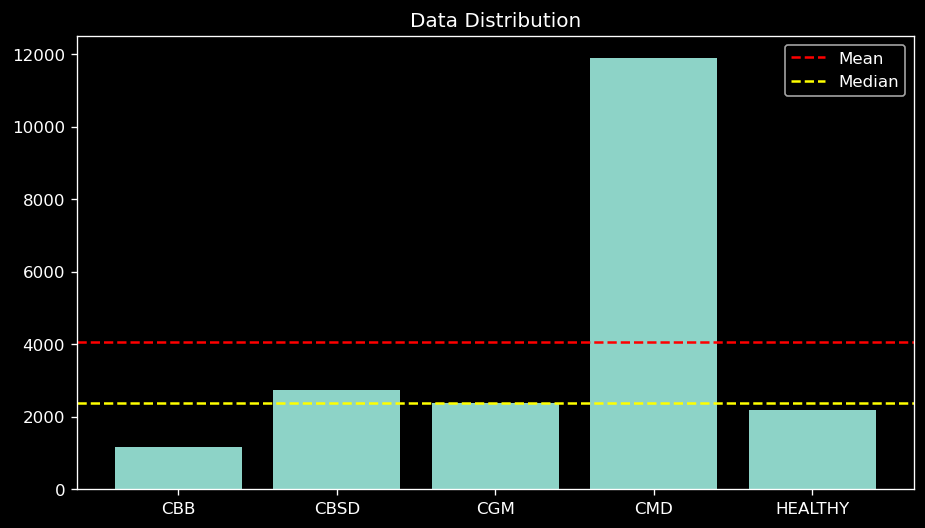

In [9]:
cat_names = ['CBB', 'CBSD', 'CGM', 'CMD', 'HEALTHY']
plt.bar(cat_names, df.loc[:,'label'].value_counts(sort=False))
plt.axhline(df.loc[:,'label'].value_counts().mean(), color='red', ls='--', label='Mean')
plt.axhline(df.loc[:,'label'].value_counts().median(), color='yellow', ls='--', label='Median')
plt.title('Data Distribution')
plt.legend()
plt.show()

<br>
<br>

## Calculate the Relative Weights

Relative Weights: [3.48424658 1.48960469 1.71279461 0.34209818 1.87022059]




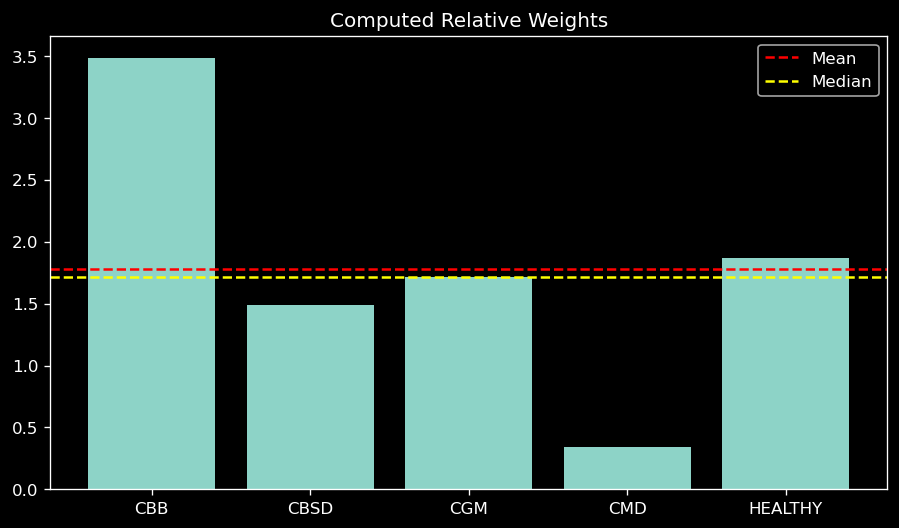

In [10]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', classes=[0,1,2,3,4], y=df.label)
print(f'Relative Weights: {weights}\n\n')

plt.bar(cat_names, weights)
plt.axhline(np.mean(weights), color='red', ls='--', label='Mean')
plt.axhline(np.median(weights), color='yellow', ls='--', label='Median')
plt.title('Computed Relative Weights')
plt.legend()
plt.show()

<br>
<br>

## Hand Tune the outlier weights

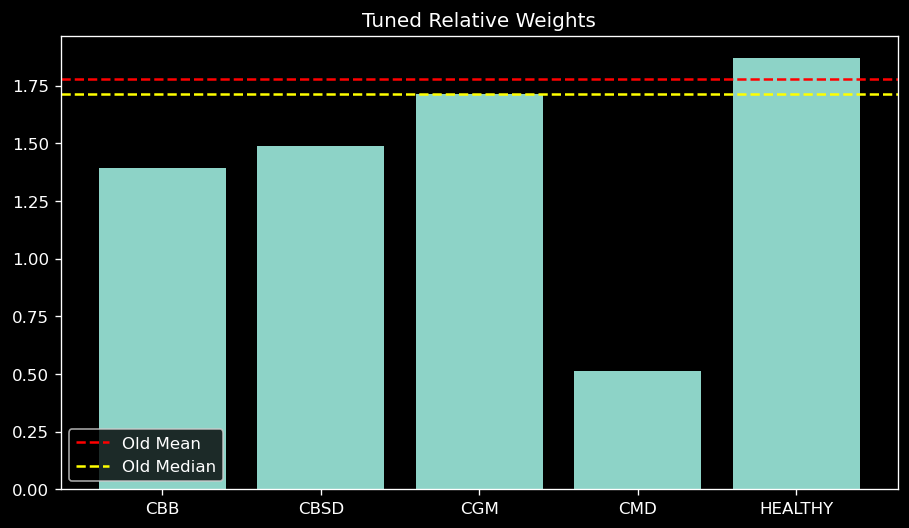

In [11]:
tuned_weights = weights.copy()
tuned_weights[0] = tuned_weights[0] * 0.4
tuned_weights[3] = tuned_weights[3] * 1.5

plt.bar(cat_names, tuned_weights)
plt.axhline(np.mean(weights), color='red', ls='--', label='Old Mean')
plt.axhline(np.median(weights), color='yellow', ls='--', label='Old Median')
plt.title('Tuned Relative Weights')
plt.legend()
plt.show()

<br>
<br>

## Calculate the new Weighted Distribution

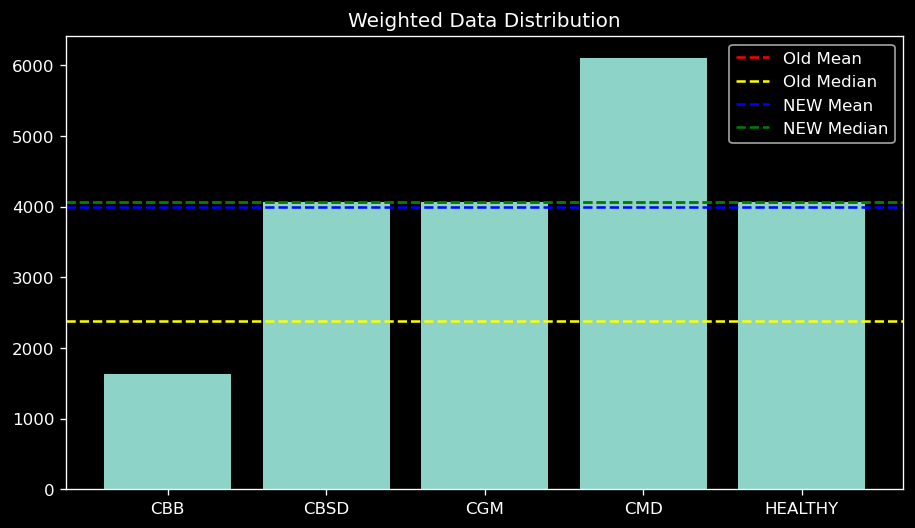

In [12]:
weighted_dist = tuned_weights * df.loc[:,'label'].value_counts(sort=False)

plt.bar(cat_names, weighted_dist)
plt.axhline(df.loc[:,'label'].value_counts().mean(), color='red', ls='--', label='Old Mean')
plt.axhline(df.loc[:,'label'].value_counts().median(), color='yellow', ls='--', label='Old Median')
plt.axhline(np.mean(weighted_dist), color='blue', ls='--', label='NEW Mean')
plt.axhline(np.median(weighted_dist), color='green', ls='--', label='NEW Median')
plt.title('Weighted Data Distribution')
plt.legend()
plt.show()

In [13]:
# convert the tuned weights to a tensor
tuned_weights = Tensor(tuned_weights).cuda()
tuned_weights

tensor([1.3937, 1.4896, 1.7128, 0.5131, 1.8702], device='cuda:0')

<br>
<br>

## Oversample the weak classes

In [14]:
df0 = df[df.label == 0]
df4 = df[df.label == 4]
df_rest = df[df.label.isin([1,2,3])]

In [15]:
df0 = pd.concat([df0,df0, df0.sample(frac=0.2)]) 
df4 = pd.concat([df4,df4.sample(frac=0.6)])
df = pd.concat([df0,df_rest,df4])
df = df.sample(frac=1)  # shuffle

## Create a list of image paths

In [16]:
train_imgs = L([Path(data_path/'train_images'/f) for f in df.image_id])
random.shuffle(train_imgs)

In [17]:
ensemble_train_imgs = L([Path(data_path/'train_images'/f) for f in ensemble_train_df.image_id])
random.shuffle(ensemble_train_imgs)

<br>
<br>

In [18]:
# get the label from any image path  @TODO sloooooowwwwww......

def get_label(o):
    fname = o.name
    if fname in df.image_id.values:
        return df[df.image_id == fname].label.values[0]
    if fname in ensemble_train_df.image_id.values:
        return ensemble_train_df[ensemble_train_df.image_id == fname].label.values[0]


<br>
<br>
<br>
<br>

# Model Development

<br>
<br>

## Create the Transforms

In [19]:
item_tfms = [ToTensor(), AlbumentationsTransform(get_train_aug(RESOLUTION), get_valid_aug(RESOLUTION))]
batch_tfms = [IntToFloatTensor(), Normalize.from_stats(*imagenet_stats)]

# item_tfms = [ToTensor(), AlbumentationsTransform(get_train_aug(RESOLUTION), get_valid_aug(RESOLUTION))]
# batch_tfms = [Normalize.from_stats(*imagenet_stats)]

<br>
<br>

## Create the Splitter

In [20]:
start_val = len(train_imgs) - int(len(train_imgs) * VALID_PERC)
idcs = list(range(start_val, len(train_imgs)))
splitter = IndexSplitter(idcs)
splits = splitter(train_imgs)
split_list = [splits[0], splits[1]]

split_list.append(L(range(len(train_imgs), len(train_imgs)+len(ensemble_train_imgs))))


The following should show 3 datasets
1. Training Set
2. Working Validation Set
3. Working Test Set

In [21]:
split_list

[(#18445) [0,1,2,3,4,5,6,7,8,9...],
 (#4611) [18445,18446,18447,18448,18449,18450,18451,18452,18453,18454...],
 (#4000) [23056,23057,23058,23059,23060,23061,23062,23063,23064,23065...]]

In [22]:
split_list[0][0], split_list[0][-1], split_list[1][0], split_list[1][-1], split_list[2][0]

(0, 18444, 18445, 23055, 23056)

<br>
<br>

## Create the Data Loaders

In [23]:
dsrc = Datasets(train_imgs+ensemble_train_imgs, tfms=[[PILImage.create], [get_label, Categorize]],
                splits = split_list)

dls = dsrc.dataloaders(bs=BATCH_SIZE, after_item=item_tfms, after_batch=batch_tfms)

In [24]:
train_labels = list(df.label.values)
train_labels.extend(ensemble_train_df.label.values)

<br>

### Verify the Training and Validation Batches

examples from the training set


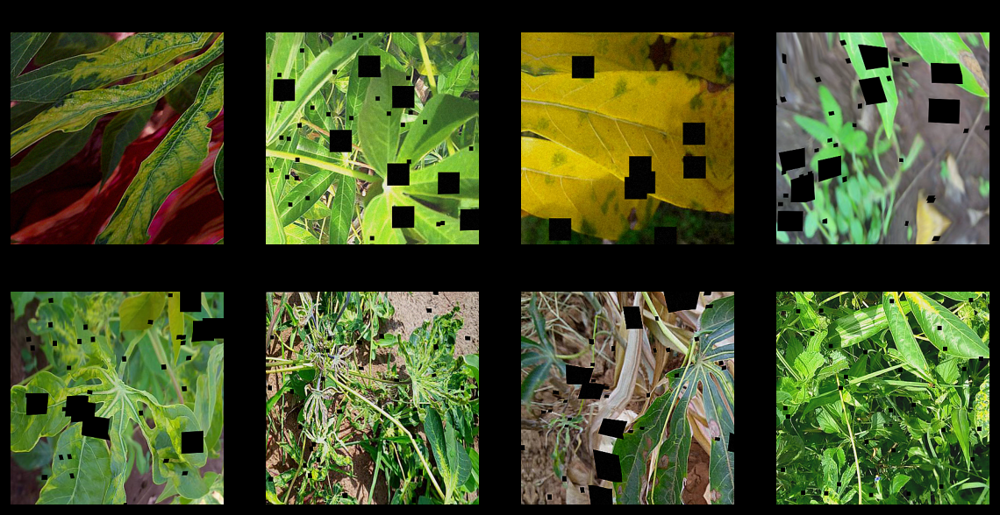

In [25]:
print('examples from the training set')
dls.train.show_batch(max_n=8, nrows=2)


examples from the validation set


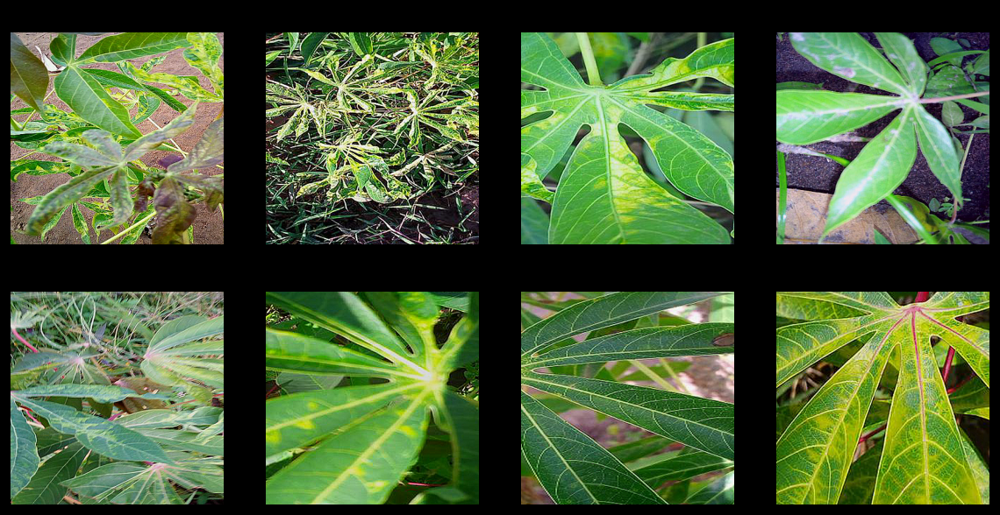

In [26]:
print('\nexamples from the validation set')
dls.valid.show_batch(max_n=8, nrows=2)

<br>
<br>

## Create our Callbacks

In [27]:
cutmix_cb = None
mixup_cb = None

def create_callbacks():
    global cutmix_cb, mixup_cb

    # Eary stopping callback
    early_stop_cb = EarlyStoppingCallback(monitor='valid_loss', patience=15, reset_on_fit=True)

    # Save the current model's weights every epoch
    save_cb = SaveModelCallback(fname=RUN_NAME, with_opt=True)

    # Reduce the Learning Rate if valid_loss flatlines
    reduceLR_cb = ReduceLROnPlateau(monitor='valid_loss', min_delta=0.01, min_lr=1e-8, patience=3, factor=10, reset_on_fit=True)

    # Mixup callback for regularization
    # mixup_cb = MixUp(alpha=0.3)
    mixup_cb = None

    # Cutmix callback for regularization
    cutmix_cb = CutMix()
#     cutmix_cb = None

    # Gradient Accumulation
    # gradacc_cb =  GradientAccumulation(n_acc=16)
    gradacc_cb =  GradientAccumulation(n_acc=128)
  
    # log our runs
    csv_log_cb = CSVLogger(fname=f'CSV-History/{RUN_NAME}.csv', append=True)


    # List of callbacks to be used later
    cbs = [save_cb, ShowGraphCallback(), GradientClip(), early_stop_cb, gradacc_cb]  #, reduceLR_cb, early_stop_cb, csv_log_cb] #, reduceLR_cb]

    if mixup_cb != None:
        cbs.insert(0, mixup_cb)

    if cutmix_cb != None:
        cbs.insert(0, cutmix_cb)

    print('\nAll Callbacks: ', cbs)
    return cbs

# empty
cbs = create_callbacks()


All Callbacks:  [CutMix, SaveModelCallback, ShowGraphCallback, GradientClip, EarlyStoppingCallback, GradientAccumulation]


### Visualize the effect of CutMix


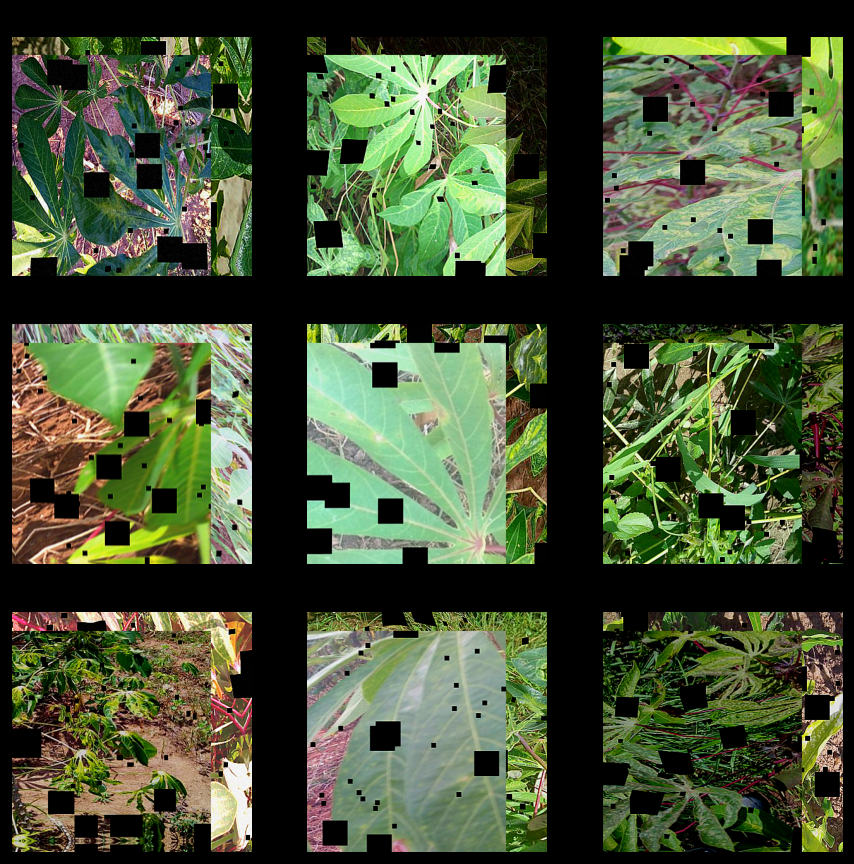

In [28]:
if cutmix_cb != None:
    with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=cutmix_cb) as learn:
        learn.epoch,learn.training = 0,True
        learn.dl = dls.train
        b = dls.one_batch()
        learn._split(b)
        learn('before_batch')

    _,axs = plt.subplots(3,3, figsize=(9,9))
    dls.show_batch(b=(cutmix_cb.x,cutmix_cb.y), ctxs=axs.flatten())
 
else: print('\n CutMix was not selected.')

<br>

### Visualize the Effect of MixUp

MixUp creates a linear interpolation between the target data and another datapoint.  In images, it shows up as ghostly figures.  The technique has been shown to be a good to decrease the liklihood of overfitting.

In [29]:
if mixup_cb != None:
    with Learner(dls, nn.Linear(3,4), loss_func=CrossEntropyLossFlat(), cbs=mixup_cb) as learn:
        learn.epoch,learn.training = 0,True
        learn.dl = dls.train
        b = dls.one_batch()
        learn._split(b)
        learn('before_batch')

    _,axs = plt.subplots(3,3, figsize=(9,9))
    dls.show_batch(b=(mixup_cb.x,mixup_cb.y), ctxs=axs.flatten())

else: print('\n MixUp was not selected.')


 MixUp was not selected.


<br>
<br>

<br>
<br>

# Model Instantiation

<br>
<br>

In [30]:


from torch.utils.checkpoint import checkpoint, checkpoint_sequential

class CheckpointModule(Module):
    def __init__(self, module, num_segments=1):
        assert num_segments == 1 or isinstance(module, nn.Sequential)
        self.module = module
        self.num_segments = num_segments

    def forward(self, *inputs):
        if self.num_segments > 1:
            return checkpoint_sequential(self.module, self.num_segments, *inputs)
        else:
            return checkpoint(self.module, *inputs)
        
        
    
def convert_seq_chkpt(model, layer_type_old):  
    conversion_count = 0
    for name, module in reversed(model._modules.items()):
        if len(list(module.children())) > 0:
            # recurse
            model._modules[name] = convert_seq_chkpt(module, layer_type_old) 

        if type(module) == layer_type_old:
#             num_chkpt += 1
            layer_old = module
#             if len(layer_old) == 7:
#                 segments = 1
#             else: segments = len(layer_old)
            segments = len(layer_old)
            layer_new = CheckpointModule(layer_old, segments)  # wrap sequential in a checkpoint module
            model._modules[name] = layer_new
#             print(segments)

    return model

In [31]:
import timm

def create_learner(cat_weights=None):
    # Create the learner
    learn = timm_learner(dls, 
                         ARCH,
                         opt_func=ranger,
                         loss_func=LabelSmoothingCrossEntropyFlat(weight=cat_weights),
#                          loss_func=LabelSmoothingCrossEntropyFlat(),
                          cbs=create_callbacks(), 
                         pretrained=PRETRAINED_FLAG,
                         metrics = [error_rate, accuracy, RocAuc()]
                        )


    # Learner Surgery - replacing modules
    learn.model[0] = convert_seq_chkpt(learn.model[0], nn.Sequential)  # hack in gradient checkpoints for memory savings
#    learn.model[0] = nn.Sequential(CheckpointModule(learn.model[0], 1))  # hack in the final checkpointmodule for the base sequence

    learn = convert_MP_to_blurMP(learn, nn.MaxPool2d)  # replace max pool with with BlurMaxPool
    learn.model[1] = convert_act_cls(learn.model[1], nn.ReLU, MishAuto())  # very expensive so we only use it on the head
    learn.model[0] = convert_act_cls(learn.model[0], nn.ReLU, SwishAuto())  # replace with a lower memory version
    
#    learn = learn.to_fp16()  # convert to mixed precision for memory savings

    learn = learn.to_non_native_fp16()

    return learn


In [32]:
learn = create_learner()


All Callbacks:  [CutMix, SaveModelCallback, ShowGraphCallback, GradientClip, EarlyStoppingCallback, GradientAccumulation]


In [33]:
display(learn.loss_func, learn.opt_func, learn.cbs) #, '-------------------------------------', learn.model)  # Checkpoint

FlattenedLoss of LabelSmoothingCrossEntropy()

<function fastai.optimizer.ranger(p, lr, mom=0.95, wd=0.01, eps=1e-06, sqr_mom=0.99, beta=0.0, decouple_wd=True)>

(#11) [TrainEvalCallback,Recorder,ProgressCallback,CutMix,SaveModelCallback,ShowGraphCallback,GradientClip,EarlyStoppingCallback,GradientAccumulation,ModelToHalf...]

In [34]:
learn.model[1]

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(full=False)
  (2): BatchNorm1d(1792, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1792, out_features=512, bias=False)
  (5): MishAuto()
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=5, bias=False)
)

In [35]:
# # RUN_NAME_OF_MODEL_TO_LOAD = '20210211-0115 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'
# EPOCH_TO_LOAD = 7

# load_model(f'models/{OLD_RUN_NAME}.pth', learn, opt=ranger, with_opt=True)
# learn.remove_cbs(CutMix)


<br>
<br>
<br>
<br>

# ------------------ RUN TO HERE -------------------

# Model Training

<br>
<br>
<br>

## Find a Good Learning Rate to Start With

In [36]:
LR_DIV = 14e0  # Shift the lr_min left by this amount.  Adjust as necessary
lr_min = 0.002  # just a default

In [37]:
# from apex.fp16_utils import convert_network
# learn.model = convert_network(learn.model, torch.float16)

In [38]:
# learn = learn.to_fp16()

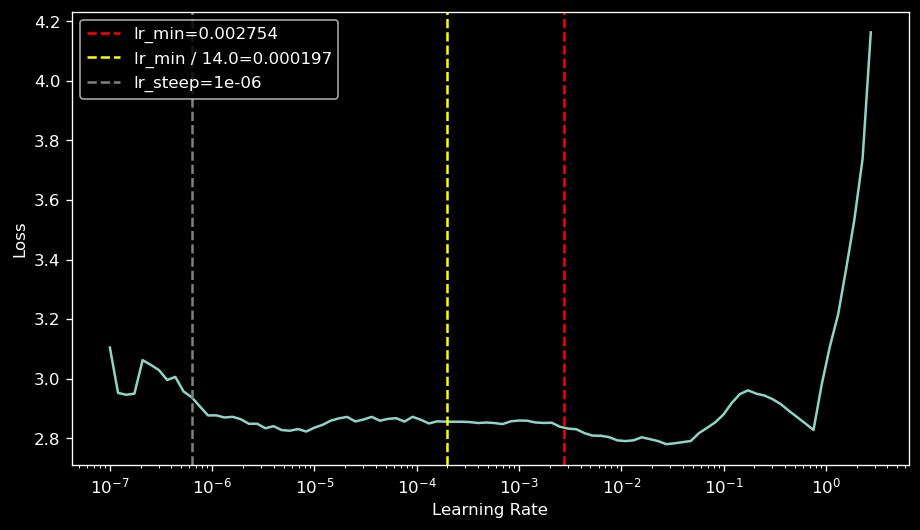

Minimum/10: 2.75e-03, steepest point: 6.31e-07, (Mim/10)/14.0: 0.00019673062488436698


In [39]:
if PRETRAINED_FLAG == True:
    learn.freeze()
    lr_min,lr_steep = learn.lr_find()
    plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
    plt.axvline(lr_min/LR_DIV, ls='--', color='yellow', label=f'lr_min / {LR_DIV}={round(lr_min/LR_DIV,6)}')
    plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
    plt.legend()
    plt.show()

    print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}, (Mim/10)/{LR_DIV}: {lr_min/LR_DIV}")

<br>
<br>

# Pick a Good Initial Learning Rate

In [40]:
# LR_CHOICE = lr_min/LR_DIV
# LR_CHOICE = lr_steep
# LR_CHOICE = 9e-3
# LR_CHOICE = 2e-4
LR_CHOICE = min(3e-2, lr_min)
#LR_CHOICE=7e-3  # working

<br>
<br>

<br>
<br>

# Training the Model

<br>

## Fit the last layers, unfreeze, fit the whole net, with a decent initial LR, all in one go.



In [41]:
if PRETRAINED_FLAG:
    print(f'FROZEN_EPOCHS:  {FROZEN_EPOCHS}')
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE}\n\n')

FROZEN_EPOCHS:  1
EPOCHS:         50
Learning Rate:  0.002754228748381138




epoch,train_loss,valid_loss,error_rate,accuracy,roc_auc_score,time
0,1.681586,1.115387,0.369117,0.630883,0.817299,06:16


Better model found at epoch 0 with valid_loss value: 1.115386962890625.


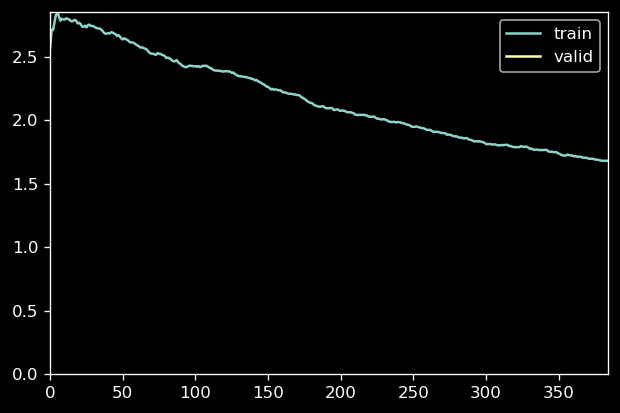

Max GPU Memory Allocated: 3.500659712 GB


In [42]:
if PRETRAINED_FLAG:
    learn.fit_flat_cos(FROZEN_EPOCHS, LR_CHOICE, pct_start=0.99, wd=0.1, reset_opt=True)
#     fit_hump(learn, 1, lr_max=LR_CHOICE, reset_opt=True)
#     learn.fit_one_cycle(FROZEN_EPOCHS, slice(LR_CHOICE), wd=0.1)

    print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
    torch.cuda.reset_max_memory_allocated()

<br>
<br>

## Manually set up the unfrozen runs

In [43]:
learn.unfreeze()

We note that the use of Gradient Checkpointing obfuscates the learning rate finder but we leave it here anyway.

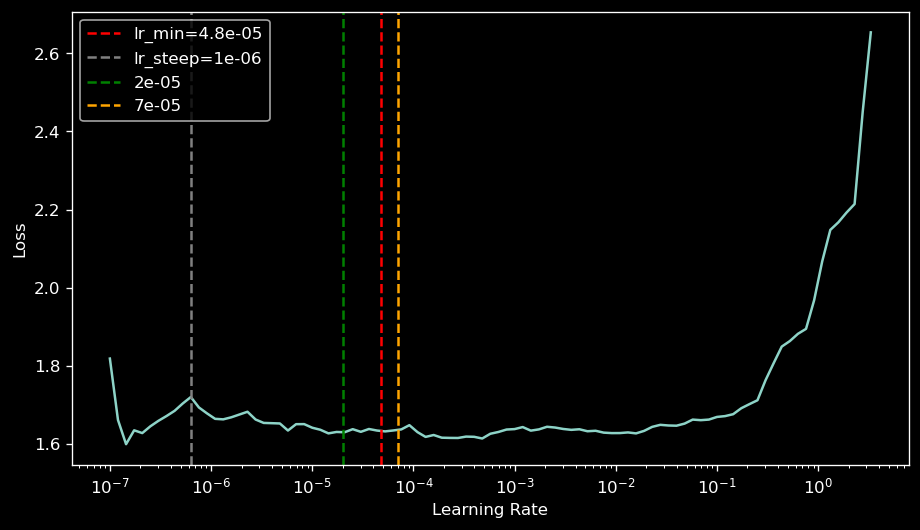

In [44]:
lr_min,lr_steep = learn.lr_find()
plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
# plt.axvline(LR_CHOICE/2, ls='--', color='yellow', label=f'LR_CHOICE/2={round(LR_CHOICE/2,6)}')
plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
plt.axvline(2e-5, ls='--', color='green', label=f'{round(2e-5,6)}')
plt.axvline(7e-5, ls='--', color='orange', label=f'{round(7e-5,6)}')

plt.legend()
plt.show()

In [45]:
print(f"Minimum/10: {lr_min:.2e}, steepest po00⁰LR_CHOICE/2: {LR_CHOICE / 2}")

Minimum/10: 4.79e-05, steepest po00⁰LR_CHOICE/2: 0.001377114374190569


In [46]:
# Persist a Copy

# Need to do this first as it won't pickle
# learn.remove_cbs(CSVLogger)

learn.export(f'models/STAGE1_{RUN_NAME}.pkl')
print(f'Saved to: models/STAGE1_{RUN_NAME}.pkl')

# put the logger back in
# learn.add_cbs(CSVLogger(fname=f'{RUN_NAME}.csv', append=True))

Saved to: models/STAGE1_20210303-0530 - arch=tf_efficientnet_b4_ns - samples=-1 frozen=1 epochs=50 bs=48 res=380.pkl


## Pick a new Learning Rate

In [47]:
# LR_CHOICE_UNFROZ = 9e-3
# LR_CHOICE_UNFROZ = 3e-3
# LR_CHOICE_UNFROZ = 4e-3
# LR_CHOICE_UNFROZ = 6e-3
# LR_CHOICE_UNFROZ = 5e-4  # working on normal, working blut slow on checkpoints
#LR_CHOICE_UNFROZ = 1e-2  # testing for checkpoints --> too erratic
LR_CHOICE_UNFROZ = 5e-4  # testing for checkpoints



# Train

In [48]:
#EPOCHS = 400

In [49]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

EPOCHS:         50
Learning Rate:  0.0005




epoch,train_loss,valid_loss,error_rate,accuracy,roc_auc_score,time
0,1.441443,0.936493,0.257645,0.742355,0.914110,07:46
1,1.255404,0.820927,0.198655,0.801345,0.943982,07:50
2,1.186591,0.816395,0.184125,0.815875,0.948347,07:50
3,1.099566,0.802888,0.160486,0.839514,0.958550,07:13
4,1.090093,0.764477,0.157883,0.842117,0.958854,07:13
5,1.088098,0.738338,0.157666,0.842334,0.962215,07:13
6,1.049336,0.751306,0.149425,0.850575,0.962055,07:13
7,1.059260,0.743208,0.154630,0.845370,0.960590,07:14
8,1.038660,0.727561,0.150293,0.849707,0.961938,07:14
9,1.047520,0.751231,0.152461,0.847538,0.962318,07:13


Better model found at epoch 0 with valid_loss value: 0.9364931583404541.


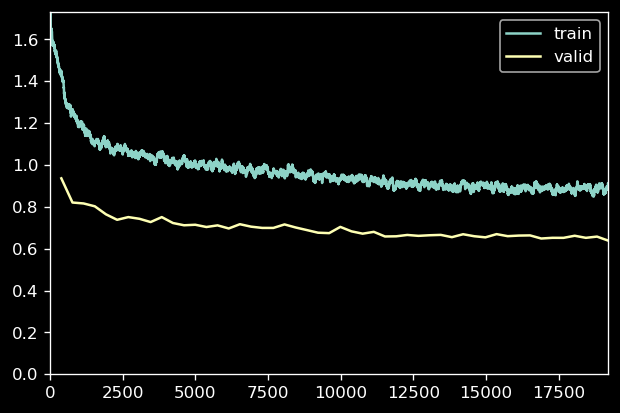

Better model found at epoch 1 with valid_loss value: 0.8209266066551208.
Better model found at epoch 2 with valid_loss value: 0.8163947463035583.
Better model found at epoch 3 with valid_loss value: 0.8028876185417175.
Better model found at epoch 4 with valid_loss value: 0.7644770741462708.
Better model found at epoch 5 with valid_loss value: 0.7383376359939575.
Better model found at epoch 8 with valid_loss value: 0.7275610566139221.
Better model found at epoch 10 with valid_loss value: 0.7229923009872437.
Better model found at epoch 11 with valid_loss value: 0.7121772170066833.
Better model found at epoch 13 with valid_loss value: 0.7039392590522766.
Better model found at epoch 15 with valid_loss value: 0.6969568133354187.
Better model found at epoch 22 with valid_loss value: 0.6893028616905212.
Better model found at epoch 23 with valid_loss value: 0.6767004132270813.
Better model found at epoch 24 with valid_loss value: 0.6746487617492676.
Better model found at epoch 27 with valid_lo

In [50]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

# learn.fit_one_cycle(EPOCHS, slice(LR_CHOICE_UNFROZ),  wd=1e-2)

learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.015, wd=1e-2, reset_opt=False)
# fit_hump(learn, EPOCHS, lr_max=LR_CHOICE_UNFROZ, reset_opt=True)

print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

In [ ]:
# LR_CHOICE_UNFROZ = 9e-3
# LR_CHOICE_UNFROZ = 3e-3
# LR_CHOICE_UNFROZ = 4e-3
# LR_CHOICE_UNFROZ = 6e-3
# LR_CHOICE_UNFROZ = 5e-4  # working on normal, working blut slow on checkpoints
# LR_CHOICE_UNFROZ = 1e-2  # testing for checkpoints --> too erratic
LR_CHOICE_UNFROZ = 2.5e-3  # testing for checkpoints 2e-3 worked



# Train

In [ ]:
EPOCHS = 60

In [ ]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

In [ ]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

# learn.fit_one_cycle(EPOCHS, slice(LR_CHOICE_UNFROZ),  wd=1e-2)

learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.7, wd=1e-1, reset_opt=True)
# fit_hump(learn, EPOCHS, lr_max=LR_CHOICE_UNFROZ, reset_opt=True)

print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

In [ ]:
# LR_CHOICE_UNFROZ = 9e-3
# LR_CHOICE_UNFROZ = 3e-3
# LR_CHOICE_UNFROZ = 4e-3
# LR_CHOICE_UNFROZ = 6e-3
# LR_CHOICE_UNFROZ = 5e-4  # working on normal, working blut slow on checkpoints
# LR_CHOICE_UNFROZ = 1e-2  # testing for checkpoints --> too erratic
LR_CHOICE_UNFROZ = 5e-3  # testing for checkpoints 2e-3 worked



# Train

In [ ]:
EPOCHS = 60

In [ ]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

In [ ]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

# learn.fit_one_cycle(EPOCHS, slice(LR_CHOICE_UNFROZ),  wd=1e-2)
learn.unfreeze()
learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.5, wd=1e-1, reset_opt=False)
# fit_hump(learn, EPOCHS, lr_max=LR_CHOICE_UNFROZ, reset_opt=True)

print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

In [ ]:
learn.recorder.plot_sched()

In [51]:
learn.save(f'{RUN_NAME}_model1')  #_acc{round(learn.validate(ds_idx=2)[2],2)}')

Path('models/20210303-0530 - arch=tf_efficientnet_b4_ns - samples=-1 frozen=1 epochs=50 bs=48 res=380_model1-p88.pth')

<br>
<br>

# 5-Fold Cross-Validation + Ensemble

Here we use 5-fold cross-validation to maximize data exposure while remaining leak free as well as to create an ensemble who's sum is greater than the parts.  Note that because we're doing N-Fold, we start by combining the train_ensemble data to the training data and because of that - we can no longer truly use it as a validation set.

Luckily, we split the data earlier (before this notebook and not even loaded yet) and we can use that to validate.  Eventually, we'll train on even the holdout data before submitting to Kaggle to test against their unexposed test data.

In [ ]:
from sklearn.model_selection import StratifiedKFold

LR_CHOICE=7e-3
LR_CHOICE_UNFROZ = 6e-3
FROZEN_EPOCHS = 2
EPOCHS = 5

skf = StratifiedKFold(n_splits=5, random_state = 42, shuffle=True)
i = 0
tw_flag = None
val_pct = []
tst_preds = []

record_df = pd.DataFrame(columns=['RUN_NAME', 'split num', 'epoch', 'loss', 'accuracy', 'roc_auc', 'tuned weights bool'])

for _, val_idx in skf.split(np.array(train_imgs+ensemble_train_imgs), train_labels):
    i += 1
    
    print('\n\n\n')
    print(f'-----------------------------------')
    print(f'------------ SPLIT {i} -------------')
    print(f'-----------------------------------')

    # sort out the data
    splits = IndexSplitter(val_idx)
    split = splits(train_imgs)
    split_list = [split[0], split[1]]
    split_list.append(L(range(len(train_imgs), len(train_imgs)+len(ensemble_train_imgs))))
    dsrc = Datasets(train_imgs+ensemble_train_imgs, tfms=[[PILImage.create], [get_label, Categorize]],
                  splits=split_list)
    dls = dsrc.dataloaders(bs=BATCH_SIZE, after_item=item_tfms, after_batch=batch_tfms)

    # Create a brand new learner model each time
    if torch.rand(1)[0] > 0.5:
        learn = create_learner(cat_weights=tuned_weights)
        tw_flag = True
    else:
        learn = create_learner(cat_weights=None)
        tw_flag = False
     
    # fit just the new head
    if PRETRAINED_FLAG == True:
        learn.freeze()
        learn.fit_flat_cos(FROZEN_EPOCHS, LR_CHOICE, pct_start=0.99, wd=0.1, reset_opt=True)
        
    learn.unfreeze()
    
    # persist
    learn.export(f'models/{RUN_NAME}_split_{i}.pkl')
    learn.save(f'{RUN_NAME}_STAGE1_split{i}_acc{round(learn.validate(ds_idx=2)[2],2)}')
    print(f'Saved to: ../models/{RUN_NAME}_split_{i}.pkl')


    # fit a series of short-run models to ensemble later.  Also simulates cos annealing with warm restarts
    for ep in range(5, 35, 5):
        
        print(f'\n\n------> EPOCH: {ep-5} - {ep}\n')

        if ep == 5:
            learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.9, wd=1e-1, reset_opt=False)
        elif ep <= 20:
            learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.7, wd=1e-1, reset_opt=False)
        elif ep == 25:
            learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ/10, pct_start=0.6, wd=1e-2, reset_opt=False)
        elif ep == 30: 
            learn.fit_flat_cos(EPOCHS+3, LR_CHOICE_UNFROZ/100, pct_start=0.5, wd=1e-2, reset_opt=False)

            
               
        # save 
        learn.save(f'{RUN_NAME}_split_{i}_epoch{ep}_acc{round(learn.validate(ds_idx=2)[2],2)}')
        
        # save stats
        val = learn.validate()
        record_df.loc[len(record_df.index)] = [RUN_NAME, i, ep, val[0], val[2], val[3], tw_flag]
        record_df.to_csv(f'CSV-History/{RUN_NAME}_record.csv')
        
        # print validation info
#         print(f'Validation on train: {learn.validate(0)}')
#         print(f'Validation on valid: {val}')
        print(f'Validation on test: {learn.validate(2)}')
   
#     learn.recorder.plot_sched()
    
    # Save the validation information to cross validate with
    val_pct.append(learn.validate()[2])
    a,b = learn.get_preds(ds_idx=2)
    tst_preds.append(a)

<br>
<br>

<br>

# -------------------- TRAIN AGAIN -----------------

<br>

<br>
<br>

### Train again

In [ ]:
# save_model("test.pth", learn, learn.opt, with_opt=True)

In [ ]:
# learn = load_learner(f'../models/{RUN_NAME}.pkl', cpu=False)
#
    # RUN_NAME_OF_MODEL_TO_LOAD = '20210210-2234 - arch=tf_efficientnet_b4_ns - samples=1800 frozen=1 epochs=15 bs=12 res=460'
    # EPOCH_TO_LOAD = 9

# load_model(f'models/{RUN_NAME_OF_MODEL_TO_LOAD}_{EPOCH_TO_LOAD}.pth', learn, opt=ranger, with_opt=False)

# load_model(f'models/{RUN_NAME}_8.pth', learn, opt=ranger, with_opt=True)
# learn = load_learner(f'../models/{RUN_NAME}.pkl', cpu=False)
# load_model(f'test.pth', learn, opt=ranger, with_opt=True)

# load_model(f'models/20210213-2138 - arch=efficientnet_b3a - samples=1800 frozen=3 epochs=60 bs=32 res=400_9.pth', learn, opt=ranger, with_opt=True)

learn.dls = dls
learn.remove_cbs(cbs)
learn.add_cbs(cbs)

learn.opt.clear_state()


In [ ]:
learn.unfreeze()

In [ ]:
# learn.dls = dls_findlr
lr_min,lr_steep = learn.lr_find()
plt.axvline(lr_min, ls='--', color='red', label=f'lr_min={round(lr_min,6)}')
# plt.axvline(LR_CHOICE/2, ls='--', color='yellow', label=f'LR_CHOICE/2={round(LR_CHOICE/2,6)}')
plt.axvline(lr_steep, ls='--', color='grey', label=f'lr_steep={round(lr_steep,6)}')
plt.axvline(2e-5, ls='--', color='green', label=f'{round(2e-5,6)}')
plt.axvline(7e-5, ls='--', color='orange', label=f'{round(7e-5,6)}')

plt.legend()
plt.show()


learn.dls = dls
del dls_findlr
gc.collect()
torch.cuda.empty_cache()
gc.collect()


In [ ]:
EPOCHS = 20
LR_CHOICE_UNFROZ = 7e-3

In [ ]:
print(f'EPOCHS:         {EPOCHS}')
print(f'Learning Rate:  {LR_CHOICE_UNFROZ}\n\n')

In [ ]:
# learn.fit_flat_cos(EPOCHS, slice(LR_CHOICE_UNFROZ), pct_start=0.68)

# learn.fit_flat_cos(EPOCHS, LR_CHOICE_UNFROZ, pct_start=0.2, wd=0.1) # , reset_opt=True)
fit_hump(learn, EPOCHS, lr_max=LR_CHOICE_UNFROZ, reset_opt=False)

print(f'Max GPU Memory Allocated: {torch.cuda.max_memory_allocated()/1000000000} GB')
torch.cuda.reset_max_memory_allocated()

<br>
<br>

## Persist the Model

In [52]:
learn.export(f'../models/{RUN_NAME}.pkl')
print(f'Saved to: ../models/{RUN_NAME}.pkl')

# path = Path('../models')
# path.ls(file_exts='.pkl')

Saved to: ../models/20210303-0530 - arch=tf_efficientnet_b4_ns - samples=-1 frozen=1 epochs=50 bs=48 res=380.pkl


<br>
<br>

### Show some Results

In [ ]:
learn.show_results()


<br>
<hr>
<br>
<br>
<br>

# Validation Set (not test set) Analysis

<br>

### Plot Losses

In [ ]:
# learn.recorder.plot_loss()
# plt.ylabel('Loss')
# plt.xlabel('Batches Processed')

In [53]:
c = learn.cbs
c

(#11) [TrainEvalCallback,Recorder,ProgressCallback,CutMix,SaveModelCallback,ShowGraphCallback,GradientClip,EarlyStoppingCallback,GradientAccumulation,ModelToHalf...]

In [59]:
def _remove_cbs(le=learn):
    _cbs = le.cbs
    
    le.remove_cbs(CutMix)
    le.remove_cbs(SaveModelCallback)
    le.remove_cbs(ShowGraphCallback)
    le.remove_cbs(EarlyStoppingCallback)
    le.remove_cbs(GradientAccumulation)
    return _cbs

In [60]:
orig_cbs = _remove_cbs()

(#6) [TrainEvalCallback,Recorder,ProgressCallback,GradientClip,ModelToHalf,NonNativeMixedPrecision]

<br>

### Visualize with a confusion Matrix

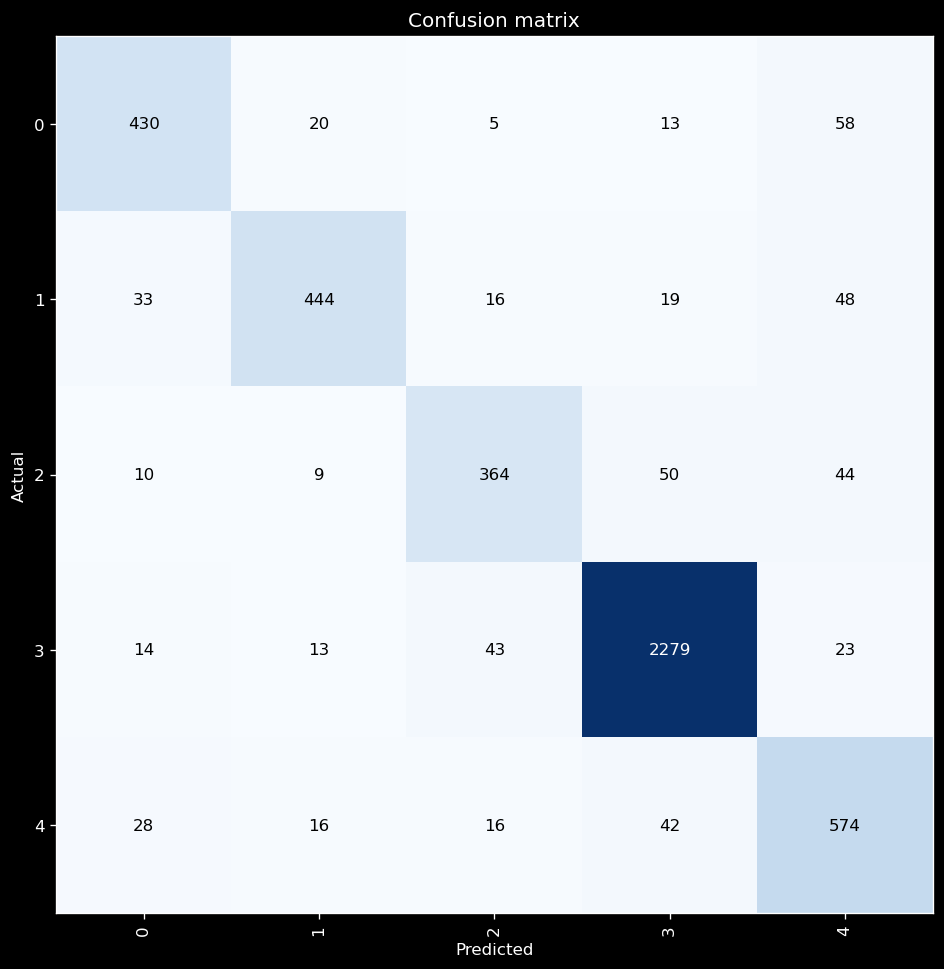

In [61]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(8,8))

In [62]:
interp.most_confused()[:10]

[(0, 4, 58),
 (2, 3, 50),
 (1, 4, 48),
 (2, 4, 44),
 (3, 2, 43),
 (4, 3, 42),
 (1, 0, 33),
 (4, 0, 28),
 (3, 4, 23),
 (0, 1, 20)]

<br>
<br>

## Classification Report

In [63]:
interp.print_classification_report()

              precision    recall  f1-score   support

           0       0.83      0.82      0.83       526
           1       0.88      0.79      0.84       560
           2       0.82      0.76      0.79       477
           3       0.95      0.96      0.95      2372
           4       0.77      0.85      0.81       676

    accuracy                           0.89      4611
   macro avg       0.85      0.84      0.84      4611
weighted avg       0.89      0.89      0.89      4611



<br>

### Show the top 15 most error prone images

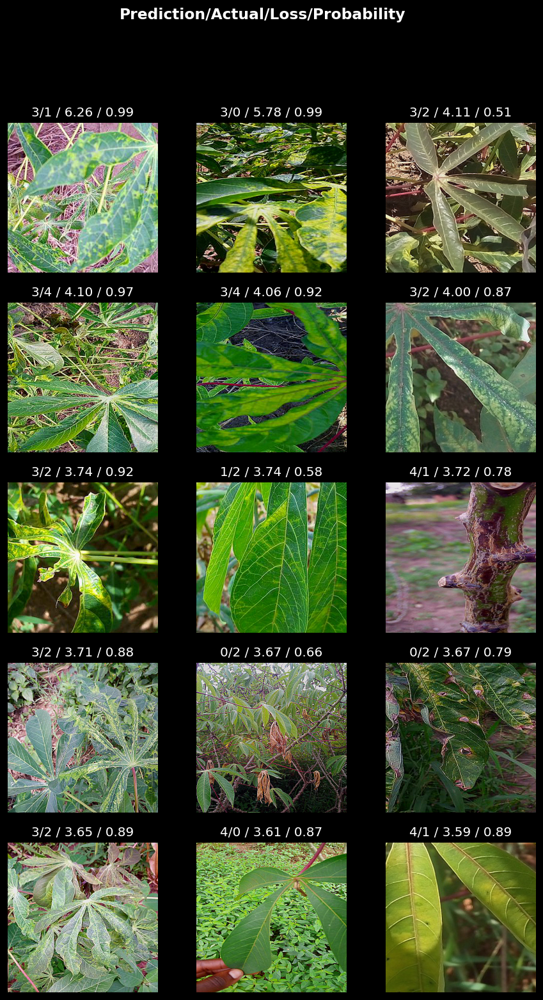

In [64]:
interp.plot_top_losses(15, nrows=5)

<br>
<br>
<br>
<br>

# ----------------- Validation ------------

<br>
<br>

<br>

In [66]:
VALID_RESOLUTION = 300
VALID_BATCH_SIZE = 12

test_learn = learn

In [ ]:
# RUN_NAME_OF_MODEL_TO_LOAD = '20210227-0137 - arch=nf_resnet50 - samples=-1 frozen=1 epochs=50 bs=32 res=256_model1_acc0.89'
# load_learner('../models/{RUN_NAME}.pkl', cpu=False)
# load_model(f'models/{RUN_NAME_OF_MODEL_TO_LOAD}.pth', test_learn, opt=ranger, with_opt=False)
test_learn.remove_cbs(test_learn.cbs)
test_learn.remove_cbs(test_learn.cbs)
test_learn.remove_cbs(test_learn.cbs)
test_learn.remove_cbs(test_learn.cbs)

In [67]:
def get_train_aug_test(): return A.Compose([
            A.RandomResizedCrop(VALID_RESOLUTION,VALID_RESOLUTION, scale=(0.2, 1)),
            A.Transpose(p=0.7),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.ShiftScaleRotate(p=0.7),
            A.HueSaturationValue(
                hue_shift_limit=0.3, 
                sat_shift_limit=0.3, 
                val_shift_limit=0.3, 
                p=0.7
            ),
            A.RandomBrightnessContrast(
                brightness_limit=(-0.2,0.2), 
                contrast_limit=(-0.2, 0.2), 
                p=0.7
            ),
            A.CoarseDropout(p=0.8, max_holes=20),
            A.Cutout(p=0.8, max_h_size=12, max_w_size=12),
            A.Sharpen(p=0.3, alpha=(0.1,0.3), lightness=(0.3, 0.9))
], p=1.0)



def get_valid_aug_test(): return A.Compose([
    A.Resize(VALID_RESOLUTION, VALID_RESOLUTION, p=1.0),
    A.OneOf([
        A.CenterCrop(VALID_RESOLUTION,VALID_RESOLUTION, always_apply=True),
        A.RandomResizedCrop(VALID_RESOLUTION,VALID_RESOLUTION, scale=(0.4, 0.7), always_apply=True),

        ], p=1.0),
        A.Resize(VALID_RESOLUTION, VALID_RESOLUTION, p=1.0),

            A.HorizontalFlip(p=0.5),

        A.HueSaturationValue(
            hue_shift_limit=0.14, 
            sat_shift_limit=0.14, 
            val_shift_limit=0.14, 
            p=0.5
            ),
        A.RandomBrightnessContrast(
            brightness_limit=(-0.15,0.15), 
            contrast_limit=(-0.1, 0.2), 
            p=0.5
            ),
    A.Sharpen(p=1, alpha=(0.1, 0.3), lightness=(0.3, 0.9))
], p=1.0)

In [68]:
test_df = pd.read_csv(data_path/'all_test_files.csv')

def get_test_fnames(path):
#     return [data_path/'train_images'/f for f in test_df.image_id]
    return list(test_df.image_id.values)



In [70]:
learn.validate(ds_idx=2)

(#4) [0.6587285399436951,0.1197499930858612,0.8802499771118164,0.9679518072545108]

In [81]:
test_dls = ImageDataLoaders.from_df(test_df, folder=data_path/'train_images', seed=42, label_col = 1, fn_col=0, 
                               batch_tfms=batch_tfms, bs=VALID_BATCH_SIZE, item_tfms=item_tfms)
test_dl = test_dls.test_dl(test_df, with_labels=True)

####  Get the Inferrences on the Test Set

In [84]:
inputs, preds, targs, decoded, losses = test_learn.get_preds(dl=test_dl, with_input=True, with_decoded=True, with_loss=True, reorder=False)
# preds, targs = test_learn.get_preds(dl=test_dl)

In [85]:
interp = ClassificationInterpretation(dl=test_dl, inputs=inputs, preds=preds, targs=targs, decoded=decoded, losses=losses )

<br>

### Visualize with a confusion Matrix

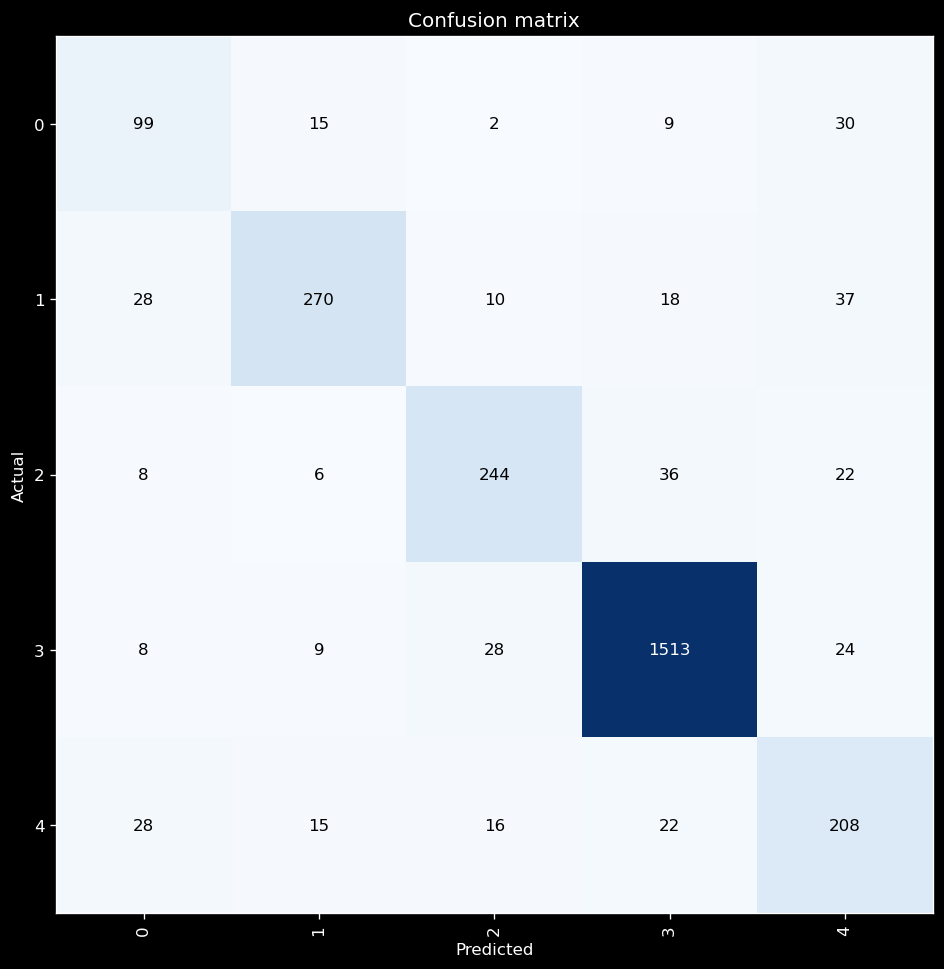

In [86]:
interp.plot_confusion_matrix(figsize=(8,8))

In [87]:
interp.most_confused()[:10]

[(1, 4, 37),
 (2, 3, 36),
 (0, 4, 30),
 (1, 0, 28),
 (3, 2, 28),
 (4, 0, 28),
 (3, 4, 24),
 (2, 4, 22),
 (4, 3, 22),
 (1, 3, 18)]

<br>
<br>

## Classification Report

In [88]:
interp.print_classification_report()

              precision    recall  f1-score   support

           0       0.58      0.64      0.61       155
           1       0.86      0.74      0.80       363
           2       0.81      0.77      0.79       316
           3       0.95      0.96      0.95      1582
           4       0.65      0.72      0.68       289

    accuracy                           0.86      2705
   macro avg       0.77      0.77      0.77      2705
weighted avg       0.87      0.86      0.86      2705



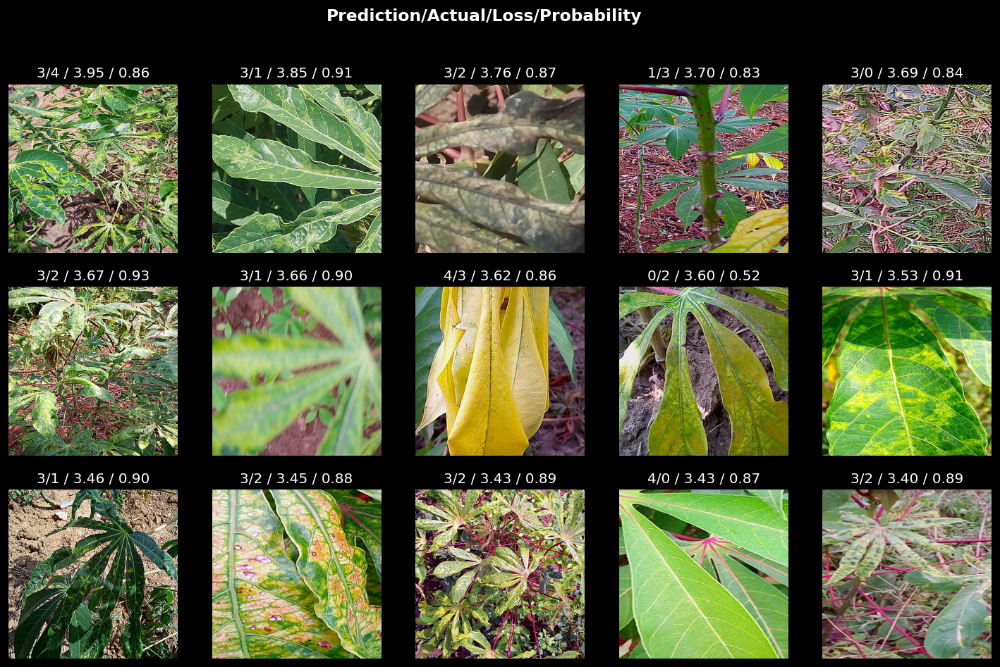

In [89]:
interp.plot_top_losses(k=15)

## Archive this version of the notebook

In [ ]:
import os
import shutil

# Allow Jupyter the opportunity to autosave
# !sleep 20
# time = '20210122-2356'
# copy the notebook file - the prefix links it to the saved model
shutil.copyfile('NFnet Cassava Disease Classification.ipynb', f'Archive/{RUN_NAME} - NFnet Cassava Disease Classification.ipynb')

In [ ]:
time

## Infer on the Kaggle provided test set

In [99]:
# predstta, targstta = test_learn.tta(dl=test_dl, n=3)  #, use_max=False, beta=0.1)

predstta, targstta = test_learn.to_fp32().tta(ds_idx=2, n=4)
# print(classification_report(df.iloc[:,0], preds.argmax(dim=-1).numpy()))  # TTA

RuntimeError: Input type (torch.cuda.ByteTensor) and weight type (torch.cuda.HalfTensor) should be the same

In [98]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

print(classification_report(predstta.argmax(dim=-1), targstta))

              precision    recall  f1-score   support

           0       0.69      0.64      0.67       245
           1       0.82      0.87      0.85       511
           2       0.81      0.86      0.84       442
           3       0.97      0.96      0.97      2348
           4       0.78      0.73      0.75       454

    accuracy                           0.89      4000
   macro avg       0.81      0.81      0.81      4000
weighted avg       0.89      0.89      0.89      4000



# FIND ALL WRONG FILES

In [ ]:
def get_test_fnames(path):
    return all_files

item_tfms = [AlbumentationsTransform(get_train_aug_test(), get_valid_aug_test())]
batch_tfms = [Normalize.from_stats(*imagenet_stats)]

test_db = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_test_fnames,
    get_y=parent_label, 
    item_tfms=item_tfms,
    batch_tfms=batch_tfms)

dls = test_db.dataloaders(get_test_fnames, bs=VALID_BATCH_SIZE)

test_dl = dls.test_dl(get_test_fnames('None'), with_labels=True)

allpreds, alltargs, alldecoded = test_learn.get_preds(dl=test_dl, with_decoded=True)

In [ ]:
inacc_flist = []

for i in range(len(alltargs)):
    if int(alltargs[i]) != int(alldecoded[i]):
        inacc_flist.append(test_dl.items[i])
        
print(f'Number of inaccurate inferrences: {len(inacc_flist)}')
print(f'Percent Accurate:  {1 - (len(inacc_flist) / len(alltargs))}')

        

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

print(classification_report(alltargs, allpreds.argmax(dim=-1)))
# confusion_matrix(alltargs, allpreds.argmax(dim=-1))

In [ ]:
import pickle
with open(f"INACCFLIST_{RUN_NAME_OF_MODEL_TO_LOAD}.p", "wb") as pfile:
    pickle.dump(inacc_flist, pfile)

In [ ]:
test_learn.predict('../data/test_images/2216849948.jpg')

In [ ]:
load_model('models/20210227-0137 - arch=nf_resnet50 - samples=-1 frozen=1 epochs=50 bs=32 res=256_model1_acc0.89.pth', learn, opt=ranger)
predstta1, targstta1 = learn.tta(ds_idx=1, n=4)
print(classification_report(predstta1.argmax(dim=-1), targstta1))

In [ ]:
load_model('models/20210227-0137 - arch=nf_resnet50 - samples=-1 frozen=1 epochs=50 bs=32 res=256_split_1_epoch30_acc0.89.pth', learn, opt=ranger)
predstta2, targstta2 = learn.tta(ds_idx=1, n=4)
print(classification_report(predstta2.argmax(dim=-1), targstta2))

In [ ]:
all_preds = predstta1.append(predstta2)
all_preds_en = all_preds.copy()

hat = all_preds_en[0]
for pred in all_preds_en[1:]:
  hat += pred

hat /= len(all_preds_en)
print(classification_report(sample_df.iloc[:,1], hat.argmax(dim=-1).numpy()))

